### Which variables will best predict high programming density "in town"?
In this notebook, we aim to understand how different variables influence the density of programmers in a town. This involves studying the relationship between programming density and various factors such as Gross Domestic Product (GDP), population dynamics, and programming level between the years 2008 - 2020

In [1]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import warnings
import numpy as np
import os
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

warnings.filterwarnings("ignore")

In [2]:
# Opening and reading the file
path = os.path.join("FINAL_no_TR.xlsx")
FINAL_no_TR = pd.read_excel(path)

FINAL_no_TR.head()

,year,nuts3_name,country,questioncount,answercount,upvotecount,downvotecount,commentcount,nuts3_code,EMP (THS),GDP (MIO_EUR),GVA (MIO_EUR),POP (THS)
0,2008,Aargau,CH,86,167,0,0,32,CH033,349.067,24942.455371,23931.324019,586.60
1,2009,Aargau,CH,370,2291,4158,265,3282,CH033,349.067,25582.147076,24614.963819,595.84
2,2010,Aargau,CH,1658,4073,12602,474,7459,CH033,349.067,28422.113810,27311.621095,604.17
3,2011,Aargau,CH,1876,6039,16410,2362,13563,CH033,348.695,32557.042431,31336.257699,614.88
4,2012,Aargau,CH,3226,6260,24401,4175,18513,CH033,355.344,33443.246005,32261.320850,622.82


This is the definition of programmers copied from the notebook "Programming Density in Towns" that we will use here.

In [3]:
#Defining number of programmers in each region based on the assumption made

weeks_in_year = 52
months_in_year = 12

#Experts in Region 
FINAL_no_TR["Experts"] = (FINAL_no_TR["answercount"] / (weeks_in_year*2))

#Innovators in Region
FINAL_no_TR["Innovators"] = FINAL_no_TR["questioncount"] / months_in_year

# Late Adopters in Region
FINAL_no_TR["Late_Adopters"] = ((FINAL_no_TR["upvotecount"] +  FINAL_no_TR["downvotecount"] + FINAL_no_TR["commentcount"])/ (months_in_year*15))

#Delete unnecessary columns and sum up all Developers
FINAL_no_TR.drop(columns = ["answercount", "questioncount", "upvotecount", "downvotecount", "commentcount"])
FINAL_no_TR["Programmers_Total"] = FINAL_no_TR["Experts"] + FINAL_no_TR["Innovators"] + FINAL_no_TR["Late_Adopters"] 

FINAL_no_TR['Programming_Density'] = FINAL_no_TR['Programmers_Total'] / (FINAL_no_TR['POP (THS)'] * 1000)
FINAL_no_TR.drop(columns = ["answercount", "questioncount", "upvotecount", "downvotecount", "commentcount"])

FINAL_no_TR['GDP_per_capita'] = FINAL_no_TR['GDP (MIO_EUR)'] / FINAL_no_TR['POP (THS)']

FINAL_no_TR

,year,nuts3_name,country,questioncount,answercount,upvotecount,downvotecount,commentcount,nuts3_code,EMP (THS),GDP (MIO_EUR),GVA (MIO_EUR),POP (THS),Experts,Innovators,Late_Adopters,Programmers_Total,Programming_Density,GDP_per_capita
0,2008,Aargau,CH,86,167,0,0,32,CH033,349.067,24942.455371,23931.324019,586.60,1.605769,7.166667,0.177778,8.950214,0.000015,42.520381
1,2009,Aargau,CH,370,2291,4158,265,3282,CH033,349.067,25582.147076,24614.963819,595.84,22.028846,30.833333,42.805556,95.667735,0.000161,42.934592
2,2010,Aargau,CH,1658,4073,12602,474,7459,CH033,349.067,28422.113810,27311.621095,604.17,39.163462,138.166667,114.083333,291.413462,0.000482,47.043239
3,2011,Aargau,CH,1876,6039,16410,2362,13563,CH033,348.695,32557.042431,31336.257699,614.88,58.067308,156.333333,179.638889,394.039530,0.000641,52.948612
4,2012,Aargau,CH,3226,6260,24401,4175,18513,CH033,355.344,33443.246005,32261.320850,622.82,60.192308,268.833333,261.605556,590.631197,0.000948,53.696487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3947,2016,Östergötland County,SE,4512,3147,18061,1583,14559,SE123,212.000,18408.070000,16305.800000,449.00,30.259615,376.000000,190.016667,596.276282,0.001328,40.997929
3948,2017,Östergötland County,SE,3633,3263,16235,1506,11172,SE123,217.000,18787.460000,16657.120000,454.99,31.375000,302.750000,160.627778,494.752778,0.001087,41.292028
3949,2018,Östergötland County,SE,3683,2516,19716,1875,14176,SE123,224.000,18855.660000,16710.180000,460.01,24.192308,306.916667,198.705556,529.814530,0.001152,40.989674
3950,2019,Östergötland County,SE,2957,2037,19970,1243,9206,SE123,226.000,18820.580000,16714.730000,464.00,19.586538,246.416667,168.994444,434.997650,0.000937,40.561595


### General Regression Analysis

In [4]:
# Correlation Matrix
correlation_matrix = FINAL_no_TR[['Programming_Density', 'GDP (MIO_EUR)', 'GVA (MIO_EUR)', 'EMP (THS)', 'GDP_per_capita']].corr()
print("Correlation Matrix:\n", correlation_matrix)

# Regression Analysis
X = FINAL_no_TR[['GDP (MIO_EUR)', 'GVA (MIO_EUR)', 'EMP (THS)', "GDP_per_capita"]]
y = FINAL_no_TR['Programming_Density']
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

Correlation Matrix:
                      Programming_Density  GDP (MIO_EUR)  GVA (MIO_EUR)  \
Programming_Density             1.000000       0.368253       0.372544   
GDP (MIO_EUR)                   0.368253       1.000000       0.999606   
GVA (MIO_EUR)                   0.372544       0.999606       1.000000   
EMP (THS)                       0.216421       0.944043       0.943102   
GDP_per_capita                  0.559412       0.397172       0.405333   

                     EMP (THS)  GDP_per_capita  
Programming_Density   0.216421        0.559412  
GDP (MIO_EUR)         0.944043        0.397172  
GVA (MIO_EUR)         0.943102        0.405333  
EMP (THS)             1.000000        0.196905  
GDP_per_capita        0.196905        1.000000  
                             OLS Regression Results                            
Dep. Variable:     Programming_Density   R-squared:                       0.367
Model:                             OLS   Adj. R-squared:                  0.366


All correlation metrics suggest a correlation, but the relationships are not that significant. R-squared suggests that economic metrics have a low influence on programming density. We are getting worried about multicollinearity, which means that GDP and GVA are highly correlated to each other (which makes sense as they are close metrics). Now, let's analyze the top regions vs. other regions. This might give a better overview of how the economic factors influence those regions.

### Country Specific Regression Analysis

In [5]:
# Identify Unique Countries
unique_countries = FINAL_no_TR['country'].unique()

# Regression Analysis for Each Country
country_specific_results = {}

for country in unique_countries:
    country_data = FINAL_no_TR[FINAL_no_TR['country'] == country]

    X = country_data[['GDP (MIO_EUR)','GVA (MIO_EUR)', 'EMP (THS)', 'GDP_per_capita']]
    y = country_data['Programming_Density']
    X = sm.add_constant(X)

    model = sm.OLS(y, X).fit()
    country_specific_results[country] = model.summary()
    
country_specific_results

{'CH': <class 'statsmodels.iolib.summary.Summary'>
 """
                              OLS Regression Results                            
 Dep. Variable:     Programming_Density   R-squared:                       0.705
 Model:                             OLS   Adj. R-squared:                  0.701
 Method:                  Least Squares   F-statistic:                     198.7
 Date:                 Sun, 26 Nov 2023   Prob (F-statistic):           7.10e-87
 Time:                         19:20:57   Log-Likelihood:                 2159.1
 No. Observations:                  338   AIC:                            -4308.
 Df Residuals:                      333   BIC:                            -4289.
 Df Model:                            4                                         
 Covariance Type:             nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
 -------------------------------------------------

The influence of economic factors on programming density varies significantly across countries. This suggests the need for country specific strategies or policies.
GDP per capita, GDP, GVA, and EMP have different influences in different countries, indicating that the economic context and structure play a significant role.
Model Fit and Reliability: R-squared values vary, showing better model fit in some countries (FR, CH) than others (ES, IT). We have also wee a warning of multicollinearity across all models suggesting that we need to be careful in interpreting the results and possibly revising the model to address these issues.

In [6]:
# Calculating Correlation between Programming Density and GDP per Capita
correlation_gdp_per_capita = FINAL_no_TR[['Programming_Density', 'GDP_per_capita']].corr().iloc[0, 1]
print("Correlation between Programming Density and GDP per Capita:", correlation_gdp_per_capita)

Correlation between Programming Density and GDP per Capita: 0.5594122314858477


### Top regions vs other regions analysis

This chart shows changes in growth for many regions around the same early years, which then stabilizes. The black line representing the average of other regions remains relatively flat compared to the top regions, which suggests that while the top regions have experienced significant fluctuations and growth in programming density, the other regions have not seen such dramatic changes. The steep initial growth followed by stabilization indicates that there might have been a surge in programming interest or industry growth during those years which then matured.

We see a steady increase in programming density for the top regions, with Paris and Stockholm County leading with the highest density towards the latest years observed. The other regions show a much flatter trend over time, which might imply that these regions have a slower growth in programming activity compared to the top regions.

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Assuming you want to divide regions into groups based on population
# Adjust the bin edges as needed
bins = [10, 100, 500, 1000, float('inf')]

# Create a new column 'population_group' based on the bins
FINAL_no_TR['population_group'] = pd.cut(FINAL_no_TR["POP (THS)"], bins, labels=['Small', 'Medium', 'Large', 'Very Large'])

# Encode the 'population_group' column to numerical values
FINAL_no_TR['population_group'] = pd.factorize(FINAL_no_TR['population_group'])[0]

In [8]:
Medium = FINAL_no_TR[FINAL_no_TR['population_group'] == 1]
Medium

,year,nuts3_name,country,questioncount,answercount,upvotecount,downvotecount,commentcount,nuts3_code,EMP (THS),GDP (MIO_EUR),GVA (MIO_EUR),POP (THS),Experts,Innovators,Late_Adopters,Programmers_Total,Programming_Density,GDP_per_capita,population_group
13,2008,Agrigento,IT,0,0,0,0,0,ITG14,127.9,6568.11,5924.70,449.80,0.000000,0.000000,0.000000,0.000000,0.000000e+00,14.602290,1
14,2009,Agrigento,IT,3,8,13,0,6,ITG14,128.0,6504.11,5876.90,450.60,0.076923,0.250000,0.105556,0.432479,9.597839e-07,14.434332,1
15,2010,Agrigento,IT,18,15,26,0,16,ITG14,127.3,6479.66,5828.80,451.50,0.144231,1.500000,0.233333,1.877564,4.158503e-06,14.351406,1
16,2011,Agrigento,IT,191,26,115,0,369,ITG14,127.4,6577.88,5908.10,452.00,0.250000,15.916667,2.688889,18.855556,4.171583e-05,14.552832,1
17,2012,Agrigento,IT,311,153,1285,31,726,ITG14,124.8,6629.87,5950.90,451.00,1.471154,25.916667,11.344444,38.732265,8.588085e-05,14.700377,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3947,2016,Östergötland County,SE,4512,3147,18061,1583,14559,SE123,212.0,18408.07,16305.80,449.00,30.259615,376.000000,190.016667,596.276282,1.328010e-03,40.997929,1
3948,2017,Östergötland County,SE,3633,3263,16235,1506,11172,SE123,217.0,18787.46,16657.12,454.99,31.375000,302.750000,160.627778,494.752778,1.087393e-03,41.292028,1
3949,2018,Östergötland County,SE,3683,2516,19716,1875,14176,SE123,224.0,18855.66,16710.18,460.01,24.192308,306.916667,198.705556,529.814530,1.151746e-03,40.989674,1
3950,2019,Östergötland County,SE,2957,2037,19970,1243,9206,SE123,226.0,18820.58,16714.73,464.00,19.586538,246.416667,168.994444,434.997650,9.374949e-04,40.561595,1


In [9]:
X = Medium[['EMP (THS)', 'POP (THS)', 'Programming_Density', 'Experts', 'Innovators', 'Late_Adopters',]]
y = Medium["GDP_per_capita"]
X = sm.add_constant(X)

model_pop = sm.OLS(y, X).fit()
pop_specific_results = model_pop.summary()
    
pop_specific_results

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         GDP_per_capita   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.614
Method:                 Least Squares   F-statistic:                     564.4
Date:                Sun, 26 Nov 2023   Prob (F-statistic):               0.00
Time:                        19:20:57   Log-Likelihood:                -7942.6
No. Observations:                2122   AIC:                         1.590e+04
Df Residuals:                    2115   BIC:                         1.594e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  23.4846      0.783     30.011      0.000      21.950      25.019
EMP (THS)               0.3430      0.013     26.555      0.000       0.318       0.368
POP (THS)              -0.1329      0.005    -24.403      0.000      -0.144      -0.122
Programming_Density   3.08e+04   1320.363     23.330      0.000    2.82e+04    3.34e+04
Experts                -0.0777      0.053     -1.457      0.145      -0.182       0.027
Innovators             -0.1476      0.011    -13.575      0.000      -0.169      -0.126
Late_Adopters           0.0878      0.014      6.093      0.000       0.060       0.116
==============================================================================
Omnibus:                     1266.476   Durbin-Watson:                   0.361
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           106319.397
Skew:                           1.956   Prob(JB):                         0.00
Kurtosis:                      37.456   Cond. No.                     1.98e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.98e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [10]:
df_cleaned = FINAL_no_TR.copy()

In [11]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge, Lasso 

# Select features and target variable
features = ['EMP (THS)', 'POP (THS)', 'GDP_per_capita', 'GDP (MIO_EUR)', 'nuts3_name', 'year']
target = 'Programming_Density'

# depending on your specific requirements
X_train, X_test, y_train, y_test = train_test_split(df_cleaned[features], df_cleaned[target], test_size=0.2, random_state=42)

# Create a linear regression model with one-hot encoding for categorical variables
model = make_pipeline(
    ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), ['EMP (THS)', 'POP (THS)', 'GDP_per_capita', 'GDP (MIO_EUR)']),
            ('cat', OneHotEncoder(), ['nuts3_name', 'year'])
        ],
        remainder='passthrough'
    ),
    Ridge(alpha = 1.0)
)

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the test set
predictions = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 1.1558637814940918e-07


   GDP_per_capita    EMP (THS)  GDP (MIO_EUR)    POP (THS) nuts3_name  year  \
0       53.134810  2001.589859  173974.715250  3274.483291      Milan  2021   
1       53.309101  2017.098965  175656.634951  3295.601912      Milan  2022   
2       53.483964  2032.728242  177354.814797  3316.856737      Milan  2023   

   Predicted_Programming_Density  
0                       0.001133  
1                       0.001213  
2                       0.001292  


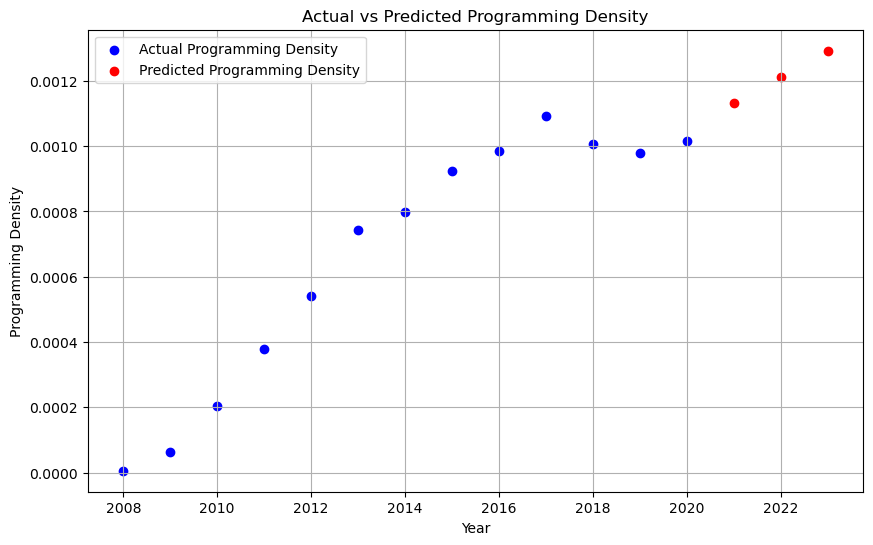

In [12]:
# Group by 'NUTS3' and calculate the mean growth rate for each variable
growth_rates = df_cleaned[['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)', "nuts3_name", "year"]].groupby('nuts3_name').apply(lambda x: x.diff().mean() / x.mean())
milan = df_cleaned[df_cleaned["nuts3_name"] == "Milan"]

#Create an empty dataframe
new_data = pd.DataFrame({
    'GDP_per_capita': [np.nan] * 3,
    'EMP (THS)': [np.nan] * 3,
    'GDP (MIO_EUR)': [np.nan] * 3,
    'POP (THS)': [np.nan] * 3,
    'nuts3_name': ['Milan'] * 3,
    'year': [2021, 2022, 2023]
})

for variable in ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)']:
    current_value = milan[variable].iloc[-1]  
    for i, row in new_data.iterrows():
        if np.isnan(row[variable]):
            current_value *= (1 + growth_rates.loc[row['nuts3_name'], variable])
            new_data.at[i, variable] = current_value

# Sort the DataFrame by year and region
new_data = new_data.sort_values(by=['year', 'nuts3_name']).reset_index(drop=True)

# Separate features and target variable
features = ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)', 'nuts3_name', 'year']
target = 'Programming_Density'

# Create a transformer that does not need to be fit separately
transformer = ColumnTransformer(
    transformers=[
        ('num', make_pipeline(StandardScaler()), ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)']),
        ('cat', make_pipeline(OneHotEncoder(sparse=False, handle_unknown='ignore')), ['nuts3_name', 'year'])
    ],
    remainder='passthrough'
)

X_train, y_train = transformer.fit_transform(milan[features]), milan[target]

# Create a linear regression model
ridge_model = Ridge(alpha=1.0)

# Fit the model to the data
ridge_model.fit(X_train, y_train)

# Use the model to make predictions for the new data
new_data_encoded_scaled = transformer.transform(new_data[features])
new_predictions = ridge_model.predict(new_data_encoded_scaled)
new_data['Predicted_Programming_Density'] = new_predictions
print(new_data)

milan_old = df_cleaned[df_cleaned["nuts3_name"] == "Milan"]

# Plotting
plt.figure(figsize=(10, 6))

# Plot the actual programming density from the training data
plt.scatter(milan_old['year'], milan_old['Programming_Density'], label='Actual Programming Density', color='blue')

# Plot the predicted programming density for the next three years
plt.scatter(new_data['year'], new_data['Predicted_Programming_Density'], label='Predicted Programming Density', color='red')

# Customize the plot
plt.title('Actual vs Predicted Programming Density')
plt.xlabel('Year')
plt.ylabel('Programming Density')
plt.legend()
plt.grid(True)
plt.show()

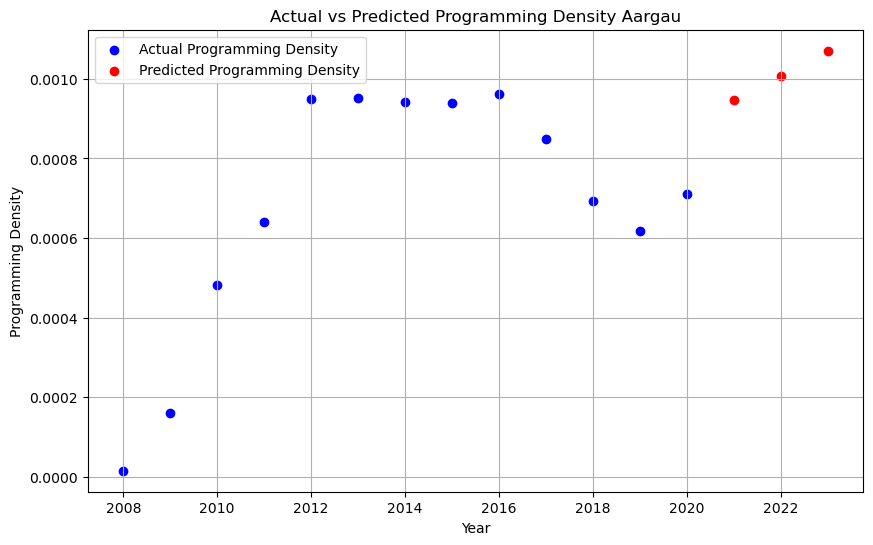

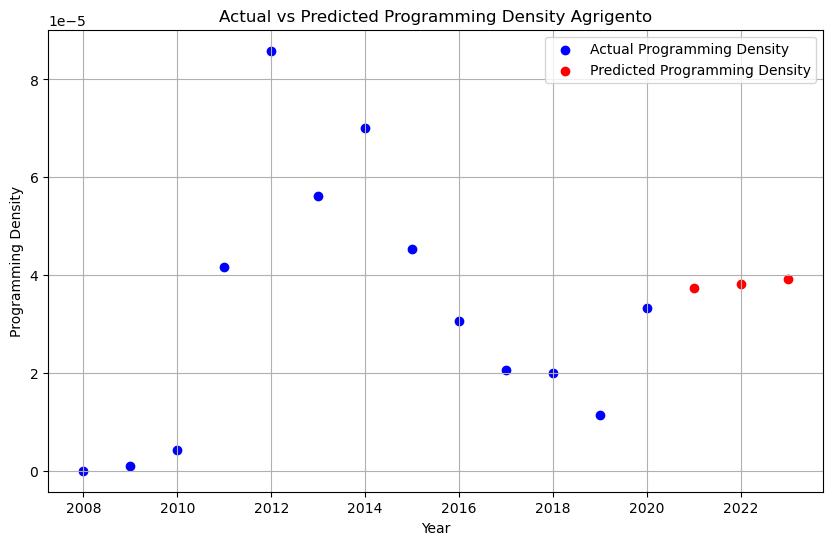

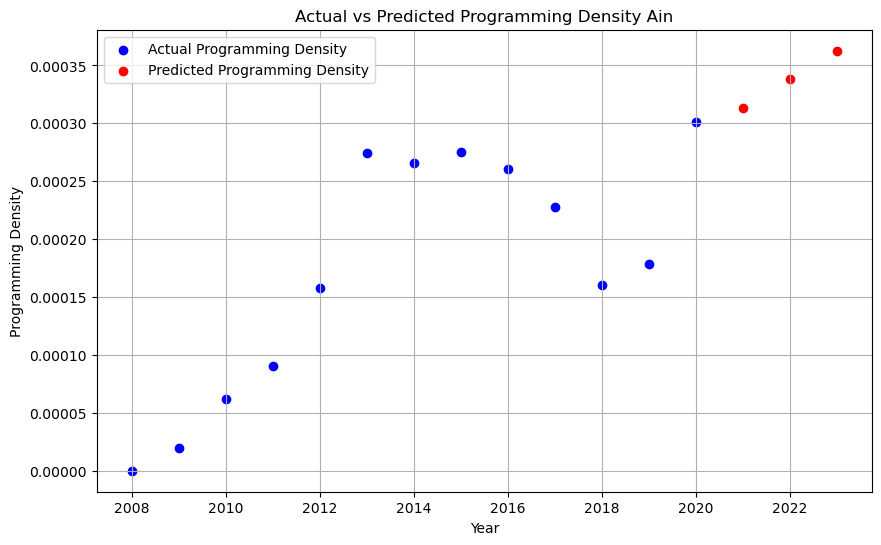

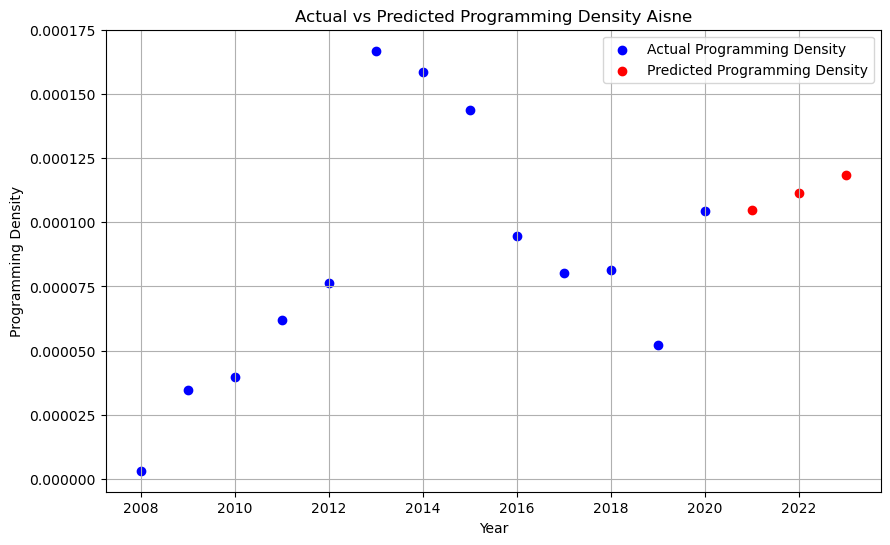

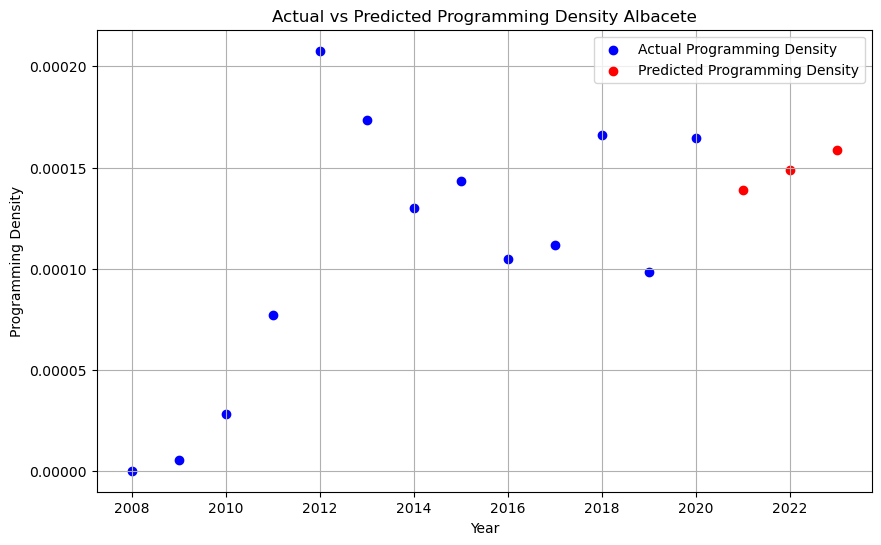

...

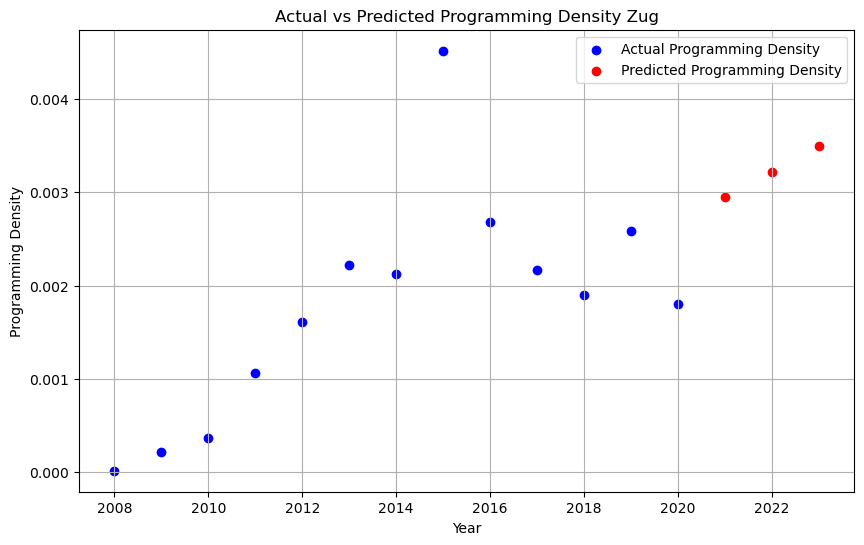

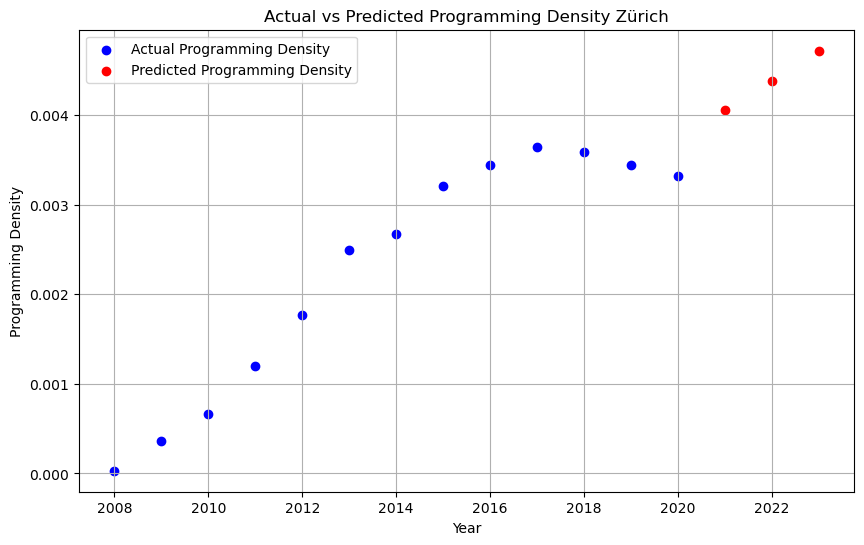

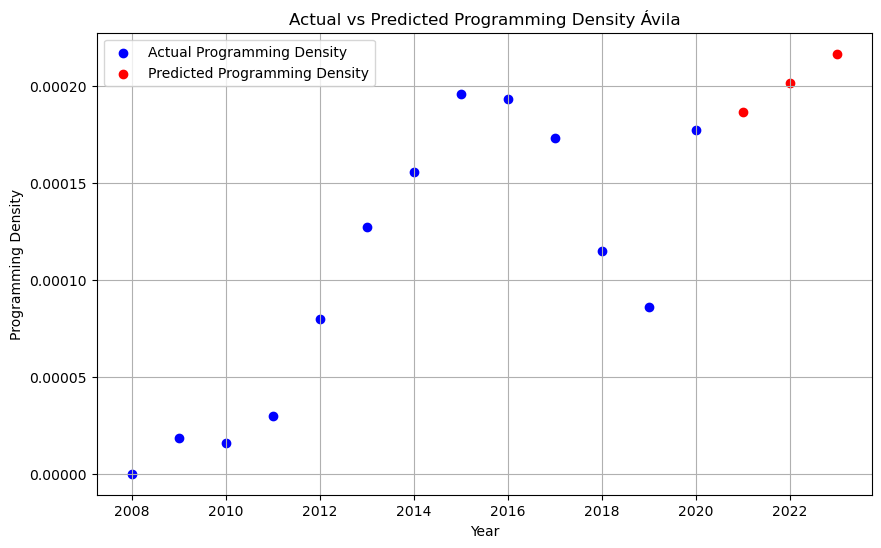

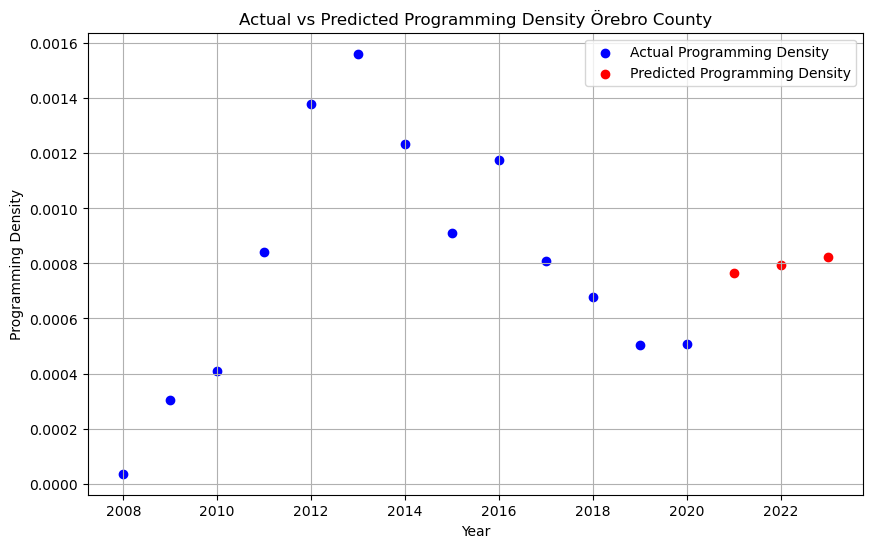

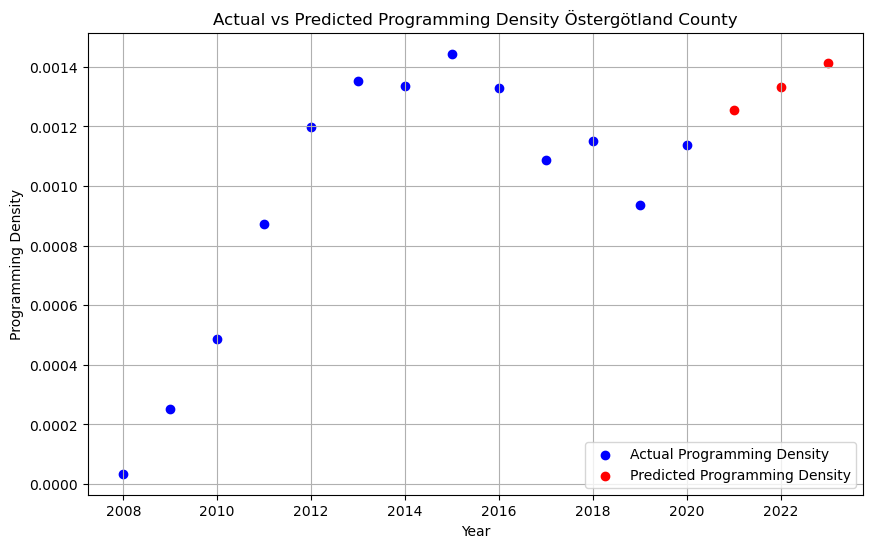

In [13]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import Ridge
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# Get unique values from 'nuts3_name' column
unique_nuts3_names = df_cleaned['nuts3_name'].unique()

# Create an empty DataFrame to store predictions
predictions_data = pd.DataFrame(columns=new_data.columns)

# Loop through each unique 'nuts3_name' value
for nuts3_name in unique_nuts3_names:
    # Filter data for the current 'nuts3_name'
    current_data = df_cleaned[df_cleaned["nuts3_name"] == nuts3_name]

    #Create an empty dataframe
    new_data_copy = pd.DataFrame({
                    'GDP_per_capita': [np.nan] * 3,
                    'EMP (THS)': [np.nan] * 3,
                    'GDP (MIO_EUR)': [np.nan] * 3,
                    'POP (THS)': [np.nan] * 3,
                    'nuts3_name': [nuts3_name] * 3,
                    'year': [2021, 2022, 2023]
                })

    for variable in ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)']:
        current_value = current_data[variable].iloc[-1]  
        for i, row in new_data_copy.iterrows():
            if np.isnan(row[variable]):
                current_value *= (1 + growth_rates.loc[row['nuts3_name'], variable])
                new_data_copy.at[i, variable] = current_value

    # Sort the DataFrame by year and region
    new_data_copy = new_data_copy.sort_values(by=['year', 'nuts3_name']).reset_index(drop=True)

    # Separate features and target variable
    features = ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)', 'nuts3_name', 'year']
    target = 'Programming_Density'

    # Create a transformer that does not need to be fit separately
    transformer = ColumnTransformer(
        transformers=[
            ('num', make_pipeline(StandardScaler()), ['GDP_per_capita', 'EMP (THS)','GDP (MIO_EUR)','POP (THS)']),
            ('cat', make_pipeline(OneHotEncoder(sparse=False, handle_unknown='ignore')), ['nuts3_name', 'year'])
        ],
        remainder='passthrough'
    )

    X_train, y_train = transformer.fit_transform(current_data[features]), current_data[target]

    # Create a linear regression model
    ridge_model = Ridge(alpha=1.0)

    # Fit the model to the data
    ridge_model.fit(X_train, y_train)

    # Use the model to make predictions for the new data
    new_data_encoded_scaled = transformer.transform(new_data_copy[features])
    new_predictions = ridge_model.predict(new_data_encoded_scaled)
    new_data_copy['Predicted_Programming_Density'] = new_predictions

    old_data = df_cleaned[df_cleaned["nuts3_name"] == nuts3_name]

    # Plotting
    plt.figure(figsize=(10, 6))

    # Plot the actual programming density from the training data
    plt.scatter(old_data['year'], old_data['Programming_Density'], label='Actual Programming Density', color='blue')

    # Plot the predicted programming density for the next three years
    plt.scatter(new_data_copy['year'], new_data_copy['Predicted_Programming_Density'], label='Predicted Programming Density', color='red')

    # Customize the plot
    plt.title('Actual vs Predicted Programming Density'+ " " + nuts3_name)
    plt.xlabel('Year')
    plt.ylabel('Programming Density')
    plt.legend()
    plt.grid(True)
    plt.show()
